In [1]:
import os 

if os.path.basename(os.getcwd()) == "notebooks":
    os.chdir("..")

In [2]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import dates as mdates
import plotly.io as pio
import datetime
import datajoint 

In [3]:
from workflow.pipeline import culture, ephys, mua, analysis

[2025-06-16 10:13:34,047][INFO]: Connecting judewerth@db.datajoint.com:3306


[2025-06-16 10:13:35,393][INFO]: Connected judewerth@db.datajoint.com:3306


**_Step 1: Start Recording Sessions_**

- Recording sessions will cover the control period and drug treatments: 
    - Control: 6 hours at start of experiment, 6 hours right before the drug treatments
    - Drug Treatments: 4-AP, No Drug (after 4-AP application), Bicuculline, Tetrodotoxin

In [4]:
# Insert Multiple Sessions

# Control Data - 6 hours at start, 6 hours at end
organoid_id = "O13"
port_id = "A"

experiment_start_time, experiment_end_time = (culture.Experiment & f"organoid_id = '{organoid_id}'" & "drug_name = 'Control'").fetch1(
    "experiment_start_time", "experiment_end_time")
insertion_number = 0
session_type = "lfp"
probe = "Q983"
used_electrodes = []

recording_len = datetime.timedelta(hours=6)
session_len = datetime.timedelta(minutes=15)
N = int(recording_len / session_len)

for i in range(N):

    # start of recording
    session_start_1 = experiment_start_time + session_len*i
    session_end_1 = session_start_1 + session_len 

    # before drug treatments
    session_end_2 = experiment_end_time - session_len*i
    session_start_2 = session_end_2 - session_len

    times = [(session_start_1, session_end_1), (session_start_2, session_end_2)]
    for start_time, end_time in times:
        
        session_key = dict(
            organoid_id = organoid_id,
            experiment_start_time = experiment_start_time,
            insertion_number = insertion_number,
            start_time = start_time,
            end_time = end_time,
        )

        session_info = dict(
            **session_key,
            session_type = session_type,
        )

        session_probe_info = dict(
            **session_key,
            probe = probe,  
            port_id = port_id,
            used_electrodes = used_electrodes
        )

        # ephys.EphysSession.insert1(session_info, skip_duplicates=True)
        # ephys.EphysSessionProbe.insert1(session_probe_info, skip_duplicates=True)


In [ ]:
# Insert Multiple Sessions

# Drug Data
organoid_id = "O18"
port_id = "B"

experiment_times = (culture.Experiment & f"organoid_id = '{organoid_id}'" & "drug_name != 'Control'").fetch(
    "experiment_start_time", "experiment_end_time")
experiment_times = np.array(experiment_times).transpose() # 4x2 array

insertion_number = 0
session_type = "lfp"
probe = "Q983"
used_electrodes = []

session_len = datetime.timedelta(minutes=15)
N = experiment_times.shape[0]


for i in range(N):

    experiment_start_time, experiment_end_time = experiment_times[i,:]

    start_time = experiment_start_time
    end_time = start_time + session_len

    while end_time <= experiment_end_time:

        session_key = dict(
            organoid_id = organoid_id,
            experiment_start_time = experiment_start_time,
            insertion_number = insertion_number,
            start_time = start_time,
            end_time = end_time,
        )

        session_info = dict(
            **session_key,
            session_type = session_type,
        )

        session_probe_info = dict(
            **session_key,
            probe = probe,  
            port_id = port_id,
            used_electrodes = used_electrodes
        )

        start_time += session_len
        end_time += session_len

        # ephys.EphysSession.insert1(session_info, skip_duplicates=True)
        # ephys.EphysSessionProbe.insert1(session_probe_info, skip_duplicates=True)


[2025-06-05 19:27:03,379][WARNING]: MySQL server has gone away. Reconnecting to the server.


**_Step 2: Understand Recording Timeline_**

- Visualize the recording timeline and when drugs are introduced.
- Know at which time points we have data avaiable: 
    - create filters for specific analysis (restrict by organoid, drug, sesison type, etc)
    - find the table which holds the desired data
    - run the script and see what data is avaiable (black=date is avaiable)

In [5]:
# Filter Tasks

# Requirements
s1 = "session_type = 'lfp'" 
s2 = "organoid_id = 'O18' OR organoid_id = 'O13'"


keys = (ephys.EphysSession & s1 & s2).fetch("KEY")
ephys.EphysSession & keys

organoid_id e.g. O17,experiment_start_time,insertion_number,start_time,end_time,session_type
O13,2023-05-25 19:18:00,0,2023-05-25 19:18:00,2023-05-25 19:33:00,lfp
O13,2023-05-25 19:18:00,0,2023-05-25 19:33:00,2023-05-25 19:48:00,lfp
O13,2023-05-25 19:18:00,0,2023-05-25 19:48:00,2023-05-25 20:03:00,lfp
O13,2023-05-25 19:18:00,0,2023-05-25 20:03:00,2023-05-25 20:18:00,lfp
O13,2023-05-25 19:18:00,0,2023-05-25 20:18:00,2023-05-25 20:33:00,lfp
O13,2023-05-25 19:18:00,0,2023-05-25 20:33:00,2023-05-25 20:48:00,lfp
O13,2023-05-25 19:18:00,0,2023-05-25 20:48:00,2023-05-25 21:03:00,lfp
O13,2023-05-25 19:18:00,0,2023-05-25 21:03:00,2023-05-25 21:18:00,lfp
O13,2023-05-25 19:18:00,0,2023-05-25 21:18:00,2023-05-25 21:33:00,lfp
O13,2023-05-25 19:18:00,0,2023-05-25 21:33:00,2023-05-25 21:48:00,lfp


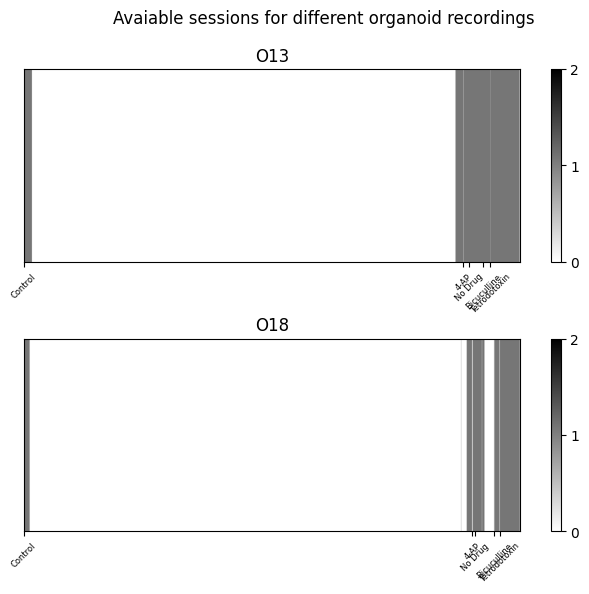

In [6]:
# Visualize Recordding Timeline

table = analysis.LFPSpectrogram.ChannelPower()
organoid_ids = np.unique((ephys.EphysSession & keys).fetch("organoid_id"))
N = len(organoid_ids)

fig, ax = plt.subplots(N, 1, figsize=(8,3*N))
fig.suptitle("Avaiable sessions for different organoid recordings")
fig.subplots_adjust(hspace=.4)

for i, organoid_id in enumerate(organoid_ids):

    organoid_table = table & keys & f"organoid_id = '{organoid_id}'"
    experiment_info = np.array((culture.Experiment & f"organoid_id = '{organoid_id}'").fetch("drug_name", "experiment_start_time", "experiment_end_time"))

    # Get start and end points for recording timeline
    recording_start, recording_end = (np.min(experiment_info[1:,:]), np.max(experiment_info[1:,:]))
    data_times = np.array(organoid_table.fetch("start_time", "end_time")).transpose()

    # Remove repeat values
    unique_times = []
    for times in data_times:
        if not list(times) in unique_times:
            unique_times.append(list(times))
    unique_times = np.array(unique_times)

    # Plot Binary Colormap for times
    recording_times = np.arange(recording_start, recording_end, datetime.timedelta(minutes=1))
    has_data = np.zeros(recording_times.shape)
    for times in unique_times:
        has_data[(times[0]<=recording_times) & (recording_times<=times[1])] +=1

    date_num = mdates.date2num(recording_times)
    extent = [date_num[0], date_num[-1], 0, 1]

    a = ax[i].imshow(has_data[np.newaxis, :], extent=extent, aspect="auto", cmap="binary")
    cbar = plt.colorbar(a)
    cbar.set_ticks(np.arange(np.min(has_data), np.max(has_data)+1))

    ax[i].set_xticks([date_num[np.where(recording_times==drug_time)][0] for drug_time in experiment_info[1,:]])
    ax[i].set_xticklabels(experiment_info[0,:], rotation=45, fontsize=6)
    ax[i].set_yticks([])
    ax[i].set_title(organoid_id)

**_Step 3: Determine Time Periods for Analysis_**

- Given the long recording timeline, it would be wise to reduce our dataset for complex analysis procedures.
- To determine the best way to reduce the dataset, we'll use power of LFP bands and firing rate z-scores: 
    - x-axis: Time (First 6 hours of recording, 6 hours before drug treatments, drug treatments (~50 hours of data per orgaonoid))
    - y-axis: z-score for power or firing rate ((data_value - control_mean)/control_std)
    - colors: Frequency bands (Delta, Theta, Alpha, Beta, Gamma, HG1, HG2), Firing Rate (max between 5*std and 25uV)
- Plot settings
    - electrodes = (list) electrodes to be used in analysis ("all"=all electrodes, "inside"=all inside, "outside"=all outside)
    - average = (bool) average electrodes or plot individual electrodes


In [7]:
def get_num_elec_inside(organoid_id: str):

    elec_inside = {
        "O9": 32, "O10": 16, "O11": 20, "O12": 14,
        "O13": 25, "O14": 13, "O15": 11, "O16": 11,
        "O17": 22, "O18": 19, "O19": 20, "O20": 17,
        "O21": 18, "O22": 21, "O23": 22, "O24": 23,
        "O25": 20, "O26": 32, "O27": 26, "O28": 24,
            }
    return elec_inside[organoid_id]

In [ ]:
# Load Data
organoid_ids, start_times, end_times, electrodes, band_names, power = (analysis.LFPSpectrogram.ChannelPower & keys).fetch("organoid_id", "start_time", "end_time", "electrode", "band_name", "mean_power")

[2025-06-16 10:21:19,022][WARNING]: MySQL server has gone away. Reconnecting to the server.


In [ ]:
# choose time bin
dt = 60 # min

# Make sure all time intevals are the same length
time_interval = end_times - start_times
if not np.all(time_interval == time_interval[0]):
    raise ValueError("All sessions need to have the same session time length")

ti_min = time_interval[0].total_seconds() / 60

# Make sure dt is a multiple of the sesssion time interval
if not (dt % ti_min) == 0:
    raise ValueError(f"Please choose a dt which is a multiple of the session length = {ti_min}")

In [141]:
# Get Data
data_dict = {}

for organoid_id in np.unique(organoid_ids):

    # Make a Figure per Organoid
    org_electrodes = np.arange(get_num_elec_inside(organoid_id))
    freq_bands = np.unique(band_names)
    freq_bands = freq_bands[[2, 6, 0, 1, 3, 4, 5]]

    organoid_bool = (organoid_ids==organoid_id)

    recording_timeline = np.arange(np.min(start_times[organoid_bool]), np.max(end_times[organoid_bool]), np.timedelta64(dt, 'm'))
    recording_timeline = recording_timeline[:-1] # remove last value 
    
    # extract data
    data_array = np.zeros((len(recording_timeline), len(freq_bands), len(org_electrodes)))
    for t, time in enumerate(recording_timeline):
        # define time window
        ts, tf = (time, time+np.timedelta64(dt, 'm'))
        time_bool = (ts <= start_times) & (start_times <= tf) # defining windows based on start times, this is an approximation because loading power series takes too long (mean power instead)

        # check if there's data in the time window -> fill in nan values and move to next iteration
        if not np.any(time_bool):
            data_array[t,:,:] = np.nan
            continue

        for b, band in enumerate(freq_bands):
            band_bool = (band_names == band)

            for e, elec in enumerate(org_electrodes):
                elec_bool = (electrodes == elec)

                # extract data
                data_bool = organoid_bool & time_bool & band_bool & elec_bool
                data_array[t, b, e] = np.mean(power[data_bool])
    data_dict[organoid_id] = (recording_timeline, data_array)


In [ ]:
# Plot Settings
take_average = True
used_electrodes = [] # [] = all inside electrodes

lfp_colors = [
    "#ad2bea",
    "#4d3ff8",
    "#39cabb",
    "#53e53a",
    "#e3e12c",
    "#f7a740",
    "#ed3838",
]

C:\Users\Organoid PC\AppData\Local\Temp\ipykernel_6724\1627119434.py:48: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale("log")
C:\Users\Organoid PC\AppData\Local\Temp\ipykernel_6724\1627119434.py:48: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale("log")


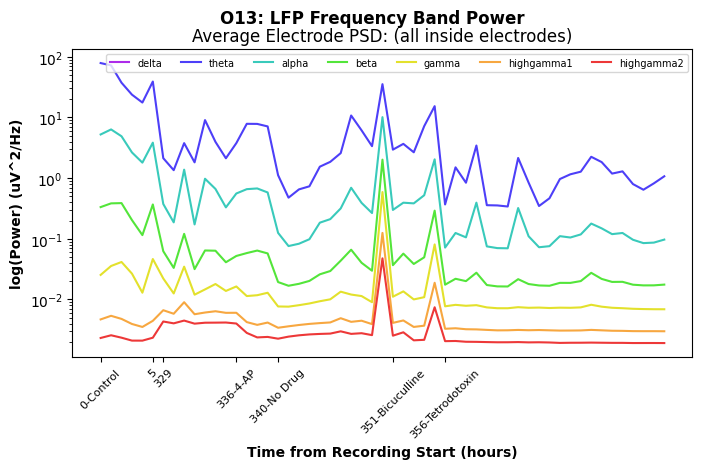

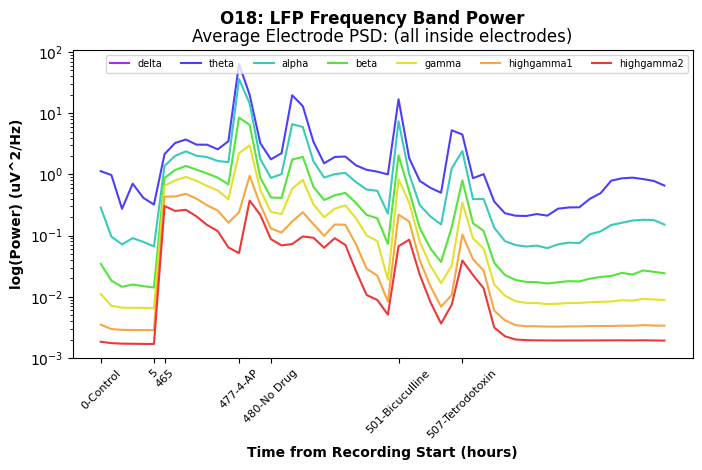

In [147]:
# Plot Data
for organoid_id, (recording_timeline, data_array) in data_dict.items():

    if len(used_electrodes) > 0:
        data_array = data_array[:,:,used_electrodes]
        elec_str = used_electrodes
    else:
        elec_str = "all inside electrodes"

    if take_average:
        plot_array = np.mean(data_array, axis=2)[:,:,np.newaxis]
        average_str = "Average"
    else:
        average_str = "Individual"

    # Remove nan values from recording timeline and plot data
    recording_bool = ~np.isnan(plot_array[:,0,0])
    plot_array = plot_array[recording_bool,:,:]
    plot_time = recording_timeline[recording_bool]

    # X-ticks (label breaks in recording and drug treatments)
    x_ticks = []
    x_tick_labels = []

    recording_time_idx = np.where(recording_bool==True)[0]
    recording_breaks = np.where(np.diff(recording_time_idx) > 12)[0]
    for recording_break in recording_breaks:
        x_ticks.extend([recording_break, recording_break+1])
        x_tick_labels.extend([recording_time_idx[recording_break], recording_time_idx[recording_break+1]])

    drug_names, drug_times = (culture.Experiment & f"organoid_id = '{organoid_id}'").fetch("drug_name", "experiment_start_time")
    for d in range(len(drug_names)):
        didx = np.argmin(np.abs(plot_time - drug_times.astype(np.datetime64)[d]))
        x_ticks.extend([didx])
        x_tick_labels.extend([f"{recording_time_idx[didx]}-{drug_names[d]}"])


    N = plot_array.shape[2]
    fig, ax = plt.subplots(N, 1, figsize=(8,4*N))
    fig.suptitle(f"{organoid_id}: LFP Frequency Band Power", weight="bold")
    for i in range(N):
        if i > 0:
            ax = ax[i]

        for f in range(len(freq_bands)):
            
            ax.plot(plot_array[:,f,i], color=lfp_colors[f], label=freq_bands[f])
            ax.set_yscale("log")

        ax.set_title(f"{average_str} Electrode PSD: ({elec_str})")
        ax.set_ylabel("log(Power) (uV^2/Hz)", weight="bold")
        ax.set_xlabel("Time from Recording Start (hours)", weight="bold")
        if i == 0:
            ax.legend(loc="upper right", ncol=7, fontsize=7)
        ax.set_xticks(x_ticks)
        ax.set_xticklabels(x_tick_labels, fontsize=8, rotation=45)


Visualize changes in firing rate
z-score of firing rate with unique control/ std values
- For the z-score of dt(n) -> u and sigma will be from dt(n-1)
- Z scores with values more extreme than 2 (+ or =) will be marked and not included for the next z-score calculation
- ex: if day 3 has an extreme value, the mean and std of day 2 will be used to calculate the zscore for day 4

In [ ]:
# Parameters
dt = 2 # hours
thresh = 2 # z-scores

def get_num_elec_inside(organoid_id: str):

    elec_inside = {
        "O09": 32, "O10": 16, "O11": 20, "O12": 14,
        "O13": 25, "O14": 13, "O15": 11, "O16": 11,
        "O17": 22, "O18": 19, "O19": 20, "O20": 17,
        "O21": 18, "O22": 21, "O23": 22, "O24": 23,
        "O25": 20, "O26": 32, "O27": 26, "O28": 24,
            }
    return elec_inside[organoid_id]

In [150]:
organoid_ids = np.unique(mua.MUASpikes().fetch("organoid_id"))

# for organoid id in organoid_ids:
organoid_id = "O09"
organoid_spikes = (mua.MUASpikes.Channel & f"organoid_id = '{organoid_id}'")

# Extract information from MUASpikes Table
start_time, channel_idx, spike_rate = organoid_spikes.fetch("start_time", "channel_idx", "spike_rate")
recording_start = (culture.Experiment & f"organoid_id = '{organoid_id}'" & "drug_name = 'Control'").fetch1("experiment_start_time")
recording_end = np.sort(start_time)[-1]

bins = np.arange(recording_start, recording_end, datetime.timedelta(hours=dt))
bins = bins[:-2] # bins = bin start times 

firing_rate_array = []
recording_ratio_list = []
# loop through time windows
for bin in bins:

    # find times for each window
    bin_bool = (bin <=start_time) & (start_time <= (bin+np.timedelta64(dt, 'h')))
    bin_times = np.unique(start_time[bin_bool])

    # extract necessary info (recording_ratio, firing rate (per channel))
    recording_ratio = len(bin_times) / dt*60 # num minutes of recording / total minutes in interval
    recording_ratio_list.append(recording_ratio)

    # loop thorugh electrodes to find firing rate
    bin_firing_rate = []
    electrodes = np.arange(get_num_elec_inside(organoid_id)) # number of electrodes inside organoid
    for electrode in electrodes:
        electrode_spikes = spike_rate[(bin_bool) & (channel_idx == electrode)] # filter by time window and electrode id
        bin_firing_rate.append(np.mean(electrode_spikes))
    
    firing_rate_array.append(bin_firing_rate)
firing_rate_array = np.array(firing_rate_array)
firing_rate_array = firing_rate_array[~np.isnan(firing_rate_array[:,0]), :]

c:\Users\Organoid PC\anaconda3\envs\utah_organoids\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\Organoid PC\anaconda3\envs\utah_organoids\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


4 periods have an abs(z-score) > 2


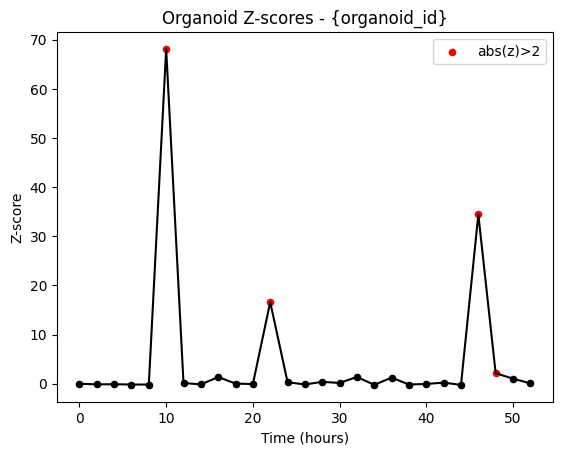

In [6]:
# Plot Moving Z-scores
N = firing_rate_array.shape[0]
fr_mean = np.mean(firing_rate_array, axis=1)
fr_std = np.std(firing_rate_array, axis=1)

z_list = []
for i in range(N):

    if i == 0:
        z = 0

    else:  
        # check if previous z scores exceed the threshold (won't use those values as a baseline)
        ref_idx = i-1
        while abs(z_list[ref_idx]) >= thresh:
            ref_idx -= 1
        
        z = (fr_mean[i] - fr_mean[ref_idx]) / fr_std[ref_idx]
    
    z_list.append(z)

z_list = np.array(z_list)
outlier_times = np.abs(z_list) > 2
print(f"{sum(outlier_times)} periods have an abs(z-score) > 2")
t = np.arange(0, dt*len(z_list), dt)

plt.plot(t, z_list, color='k', linestyle='-')
plt.scatter(t[~outlier_times], z_list[~outlier_times], s=20, color='k')
plt.scatter(t[outlier_times], z_list[outlier_times], s=20, color='r', label="abs(z)>2")

plt.title("Organoid Z-scores - {organoid_id}")
plt.ylabel("Z-score")
plt.xlabel("Time (hours)")
plt.legend()


C:\Users\Organoid PC\AppData\Local\Temp\ipykernel_11444\1921858914.py:21: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



([<matplotlib.axis.XTick at 0x16533815630>,
 [Text(0, 0, '0'), Text(119, 0, '119')])

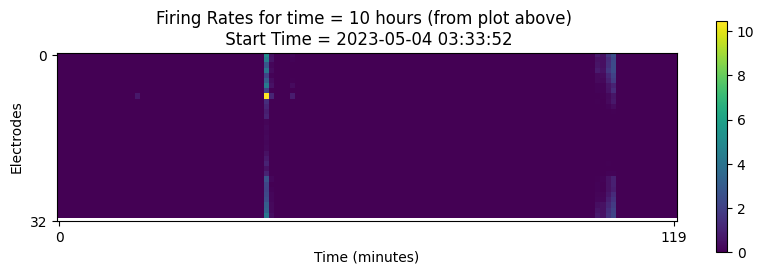

In [18]:
# Investigate Peak at 10 hours
idx = 5

idx_time = bins[idx]
time_spikes = organoid_spikes & f"start_time BETWEEN '{idx_time}' AND '{idx_time+np.timedelta64(dt, 'h')}'"

# Extract information from MUASpikes Table
start_time, channel_idx, spike_rate = time_spikes.fetch("start_time", "channel_idx", "spike_rate")

times = np.unique(start_time)
N = len(times)
num_elec = get_num_elec_inside(organoid_id)

firing_rate_array = np.empty((num_elec, N))

# loop through times and electrodes
for t, time in enumerate(times):
    for elec in range(num_elec):
        
        firing_rate = spike_rate[(start_time == time) & (channel_idx == elec)]
        firing_rate_array[elec, t] = firing_rate

plt.figure(figsize = (10,3))
plt.imshow(firing_rate_array)
plt.colorbar()

plt.title(f"Firing Rates for time = {idx*dt} hours (from plot above) \n Start Time = {times[0]}")
plt.ylabel("Electrodes")
plt.xlabel("Time (minutes)")
plt.yticks([0, num_elec])
plt.xticks([0, t])



In [16]:
# Investigate the maximum value 
max_idx = np.argmax(firing_rate_array)
max_channel, max_time_idx = np.unravel_index(max_idx, firing_rate_array.shape)
max_time = times[max_time_idx]

trace_plot = (mua.MUATracePlot.Channel & f"channel_idx = '{max_channel}'" & f"start_time = '{max_time}'").fetch1("trace_plot")

fig = pio.from_json(trace_plot)
fig.show()

[2025-06-13 19:25:18,686][WARNING]: MySQL server has gone away. Reconnecting to the server.
